Uses the environment "velocity".

In [88]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import pygam
import gseapy
import single_cell_analysis

In [89]:
# Read input file

working_directory = "RNA Sequencing Data/"

# Use adata from velocity analysis
adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'log1p', 'neighbors', 'pca', 'sample_colors', 'sde_velocity_graph', 'sde_velocity_graph_neg', 'sde_velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'sde_velocity_fdl'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'pred_s', 'pred_u', 'sde_velocity', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'


In [90]:
# Read raw dataframe and add that to .raw

adata_raw = scanpy.read_h5ad(working_directory + "/splice_counts_mm10.h5ad")
adata.raw = adata_raw.copy()

In [91]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [92]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [93]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [94]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [95]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

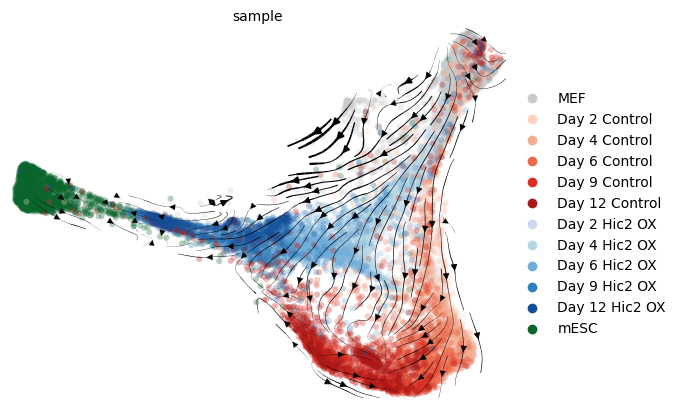

In [9]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

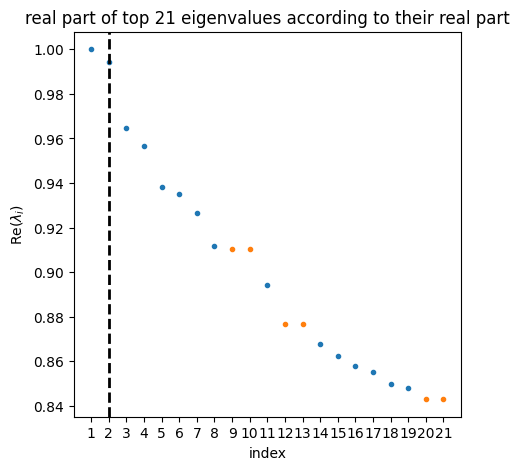

In [10]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

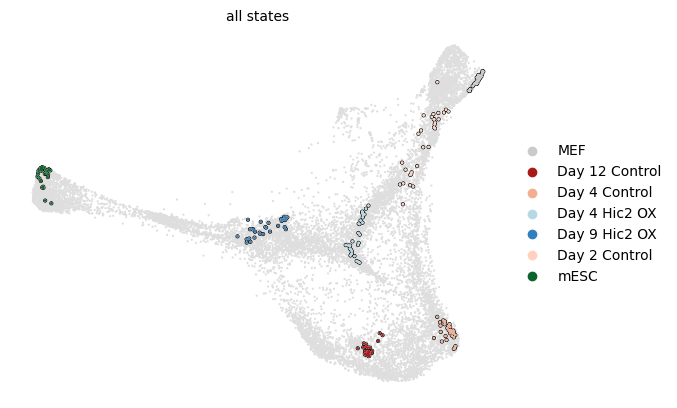

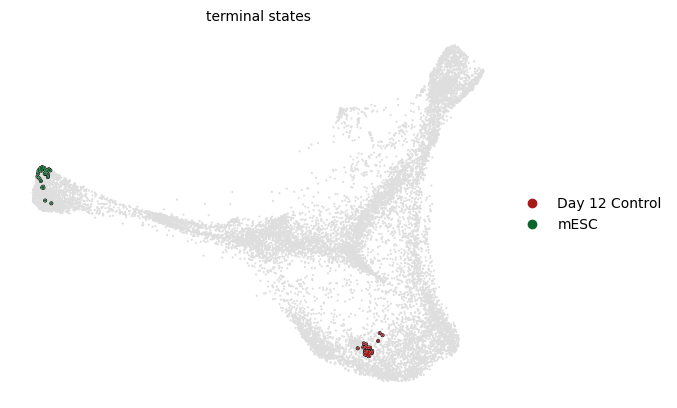

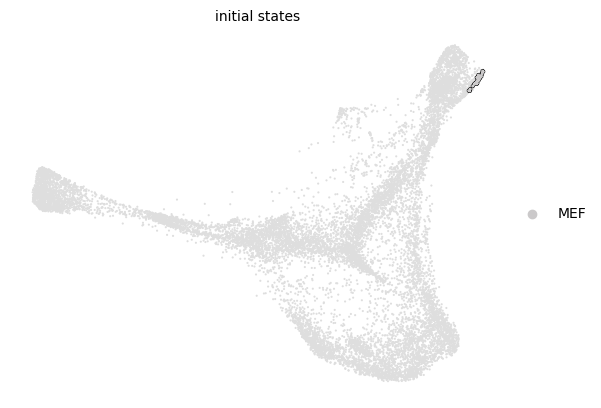

In [85]:
# Find 7 macrostates
estimator.compute_macrostates(n_states=7, cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

In [86]:
# Rename macrostates

estimator.rename_terminal_states({"mESC": "Stem cell", "Day 12 Control": "Dead end"})
terminal_states = estimator.terminal_states_memberships.names

In [81]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
6            mESC   0.996307
1  Day 12 Control   0.976904
2   Day 4 Control   0.972855
4   Day 9 Hic2 OX   0.964469
3   Day 4 Hic2 OX   0.940375
0             MEF   0.936240
5   Day 2 Control   0.928947


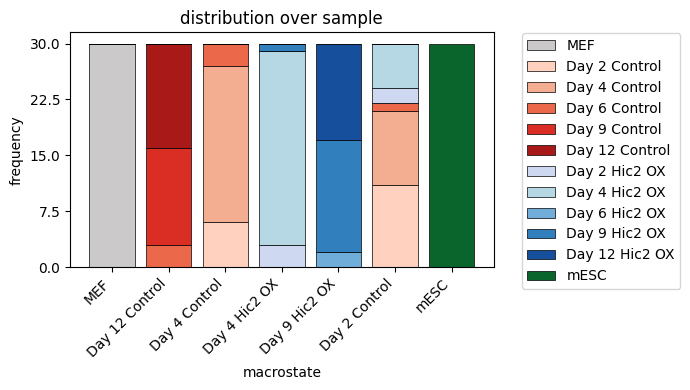

In [82]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

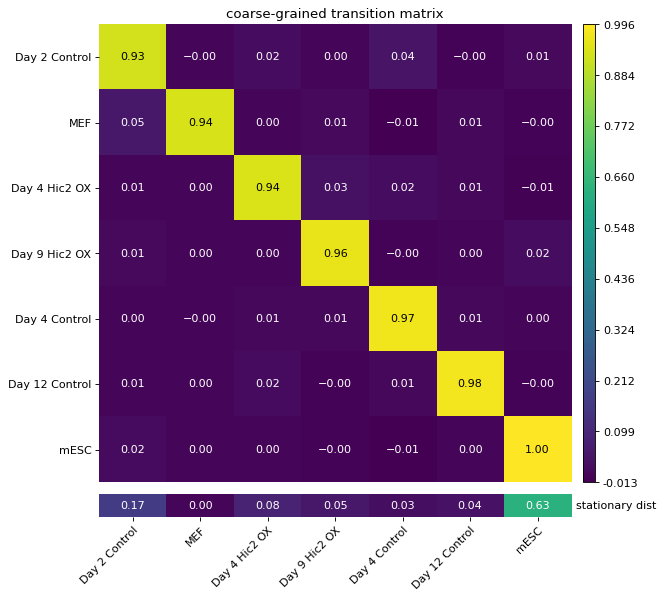

In [83]:
estimator.plot_coarse_T()

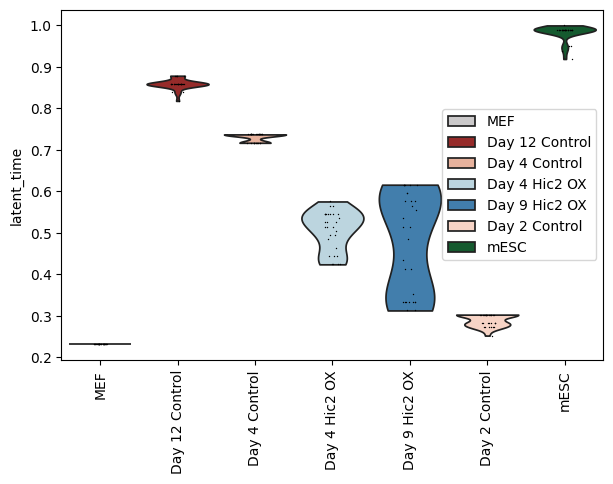

In [15]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

  0%|          | 0/2 [00:00<?, ?/s]

  0%|          | 0/2 [00:00<?, ?/s]

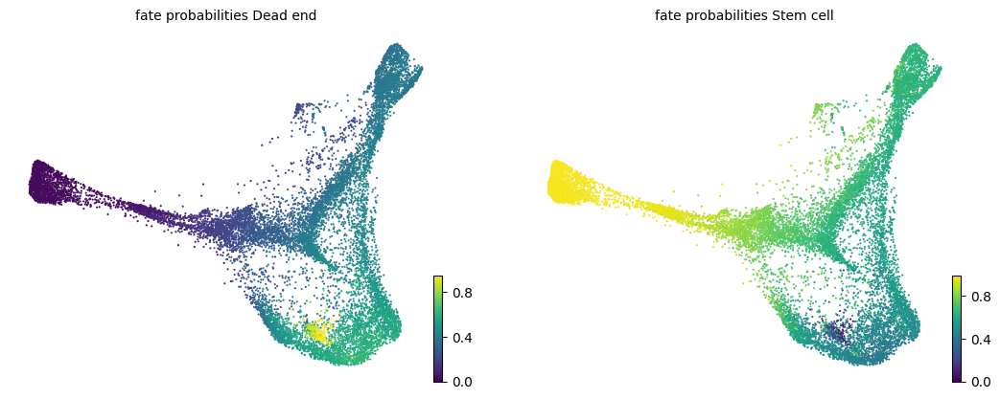

In [87]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

# Setup for plotting gene trends

In [97]:
# Define colors for all three groups

group_colors = [
    "#cbc9ca",
    "#0a652c",
    "#da2e24",
    "#3180bd",
]

adata.uns["group_colors"] = group_colors

control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

corr_column = terminal_states[-1]+"_corr"

# Drivers in all control and Hic2 cells

In [18]:
reprogramming_groups = ["Hic2", "control"]

# Find driver genes for all terminal states
driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)

In [19]:
# Drivers for dead end
driver_df.sort_values(corr_column, ascending=True).head(30)[[corr_column]]

,mESC_corr
gene_names,
Cd24a,-0.666161
Lmo1,-0.591417
Crip2,-0.579637
Ctsz,-0.574908
Lgals7,-0.573641
Rtn4r,-0.570927
Tmem238,-0.536205
S100a16,-0.525246
Pcolce2,-0.525131


In [20]:
# Drivers for mESCs
driver_df.sort_values(corr_column, ascending=False).head(30)[[corr_column]]

,mESC_corr
gene_names,
Rbpms2,0.602228
Mdk,0.588931
Fbxo15,0.588022
Folr1,0.579031
Utf1,0.577003
Apoc1,0.566876
Dnmt3l,0.561188
Gdf3,0.558953
Klhl13,0.558729


In [21]:
# How genes of interest correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3", "Hic2", "Sall4", "Shisa8", "Myc", "Cdkn1a"]

driver_df.loc[genes_of_interest][[corr_column]]

,mESC_corr
gene_names,
Krtdap,-0.108541
Krt8,-0.440561
Krt14,-0.343188
Nanog,0.309878
Tet1,0.484521
Cdh1,-0.308703
Ovol1,-0.443452
Atf3,-0.337882
Hic2,0.185105


In [22]:
# How stem cell drivers correlate with fate probability

stem_cell_tfs = ['Jarid2', 'Klf2', 'Rest', 'Tcf7l1', 'Zfp42']

driver_df.loc[stem_cell_tfs][[corr_column]].sort_values(corr_column, ascending=False)

,mESC_corr
gene_names,
Jarid2,0.503923
Zfp42,0.467972
Tcf7l1,0.431661
Rest,0.388094
Klf2,0.369637


In [23]:
# How dead end drivers correlate with fate probability

dead_end_tfs = ['Dmrtc2', 'Myc', 'Ovol1', 'Tlx2', 'Zbtb7c', 'Cdh1']

driver_df.loc[dead_end_tfs][[corr_column]].sort_values(corr_column)

,mESC_corr
gene_names,
Tlx2,-0.479133
Ovol1,-0.443452
Dmrtc2,-0.442655
Zbtb7c,-0.357488
Myc,-0.348143
Cdh1,-0.308703


## Trends for identified control drivers

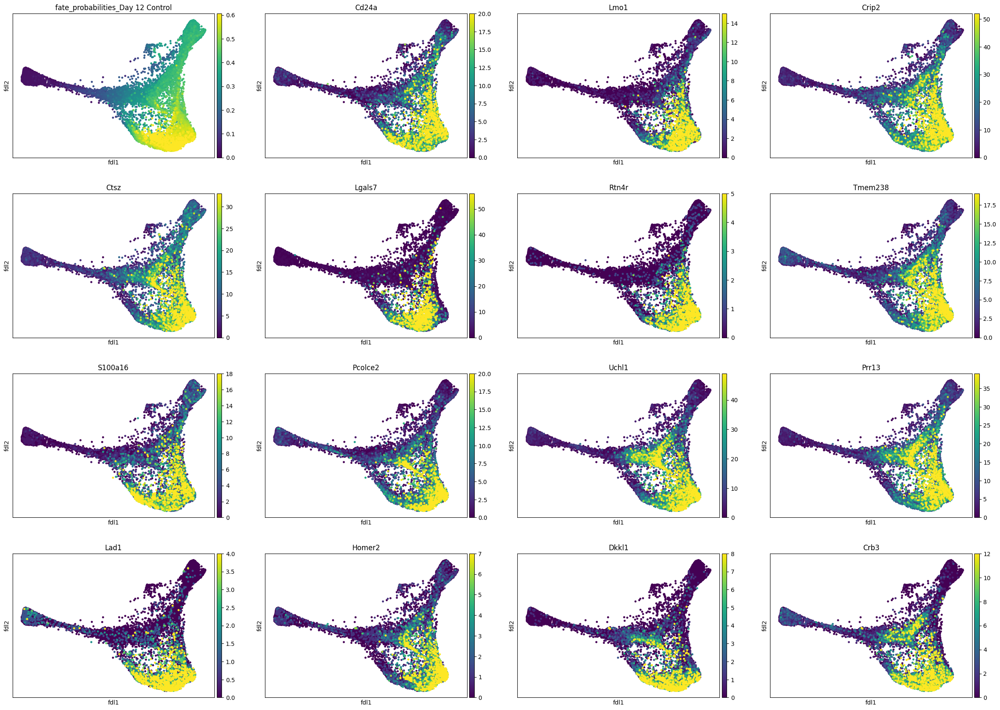

In [24]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

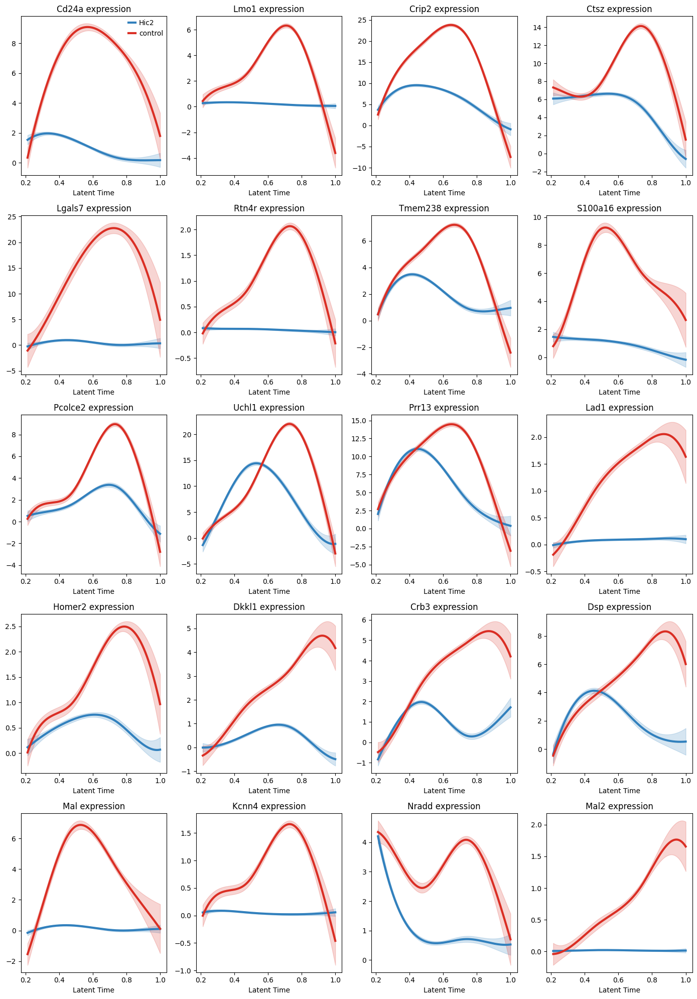

In [98]:
# Expression of drivers
dead_end_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=False).head(20).index

single_cell_analysis.plot_grouped_gene_trend(
    adata, 
    dead_end_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

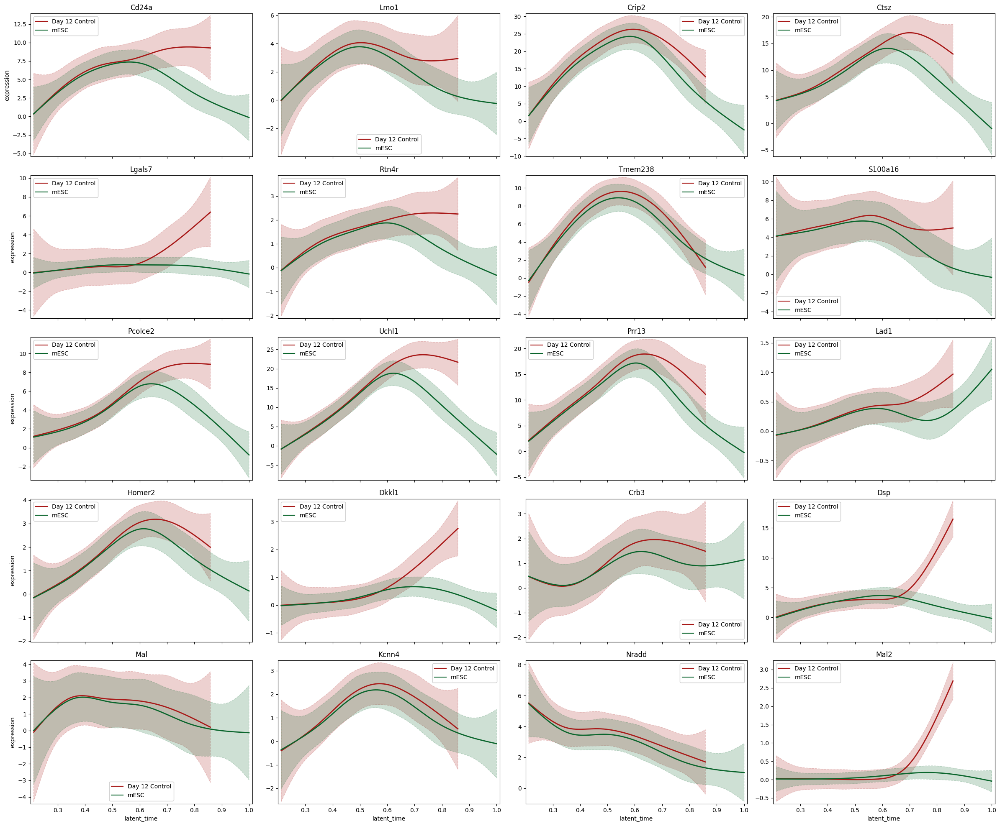

In [26]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

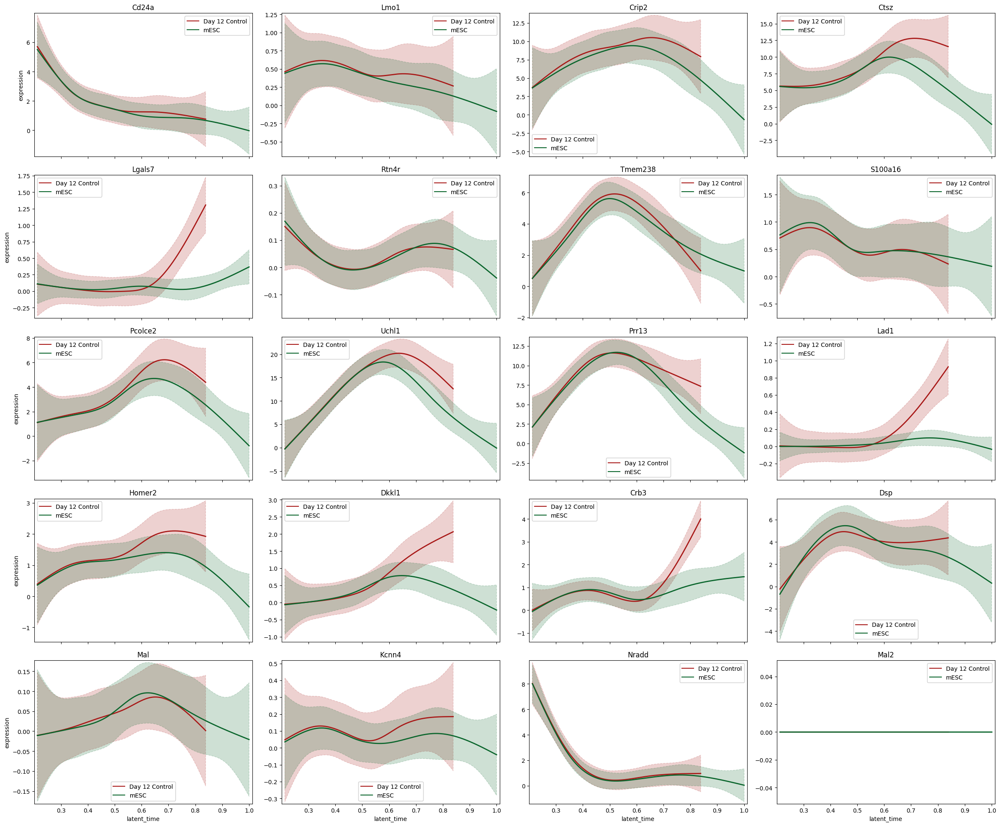

In [27]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


## Trends for identified reprogramming drivers

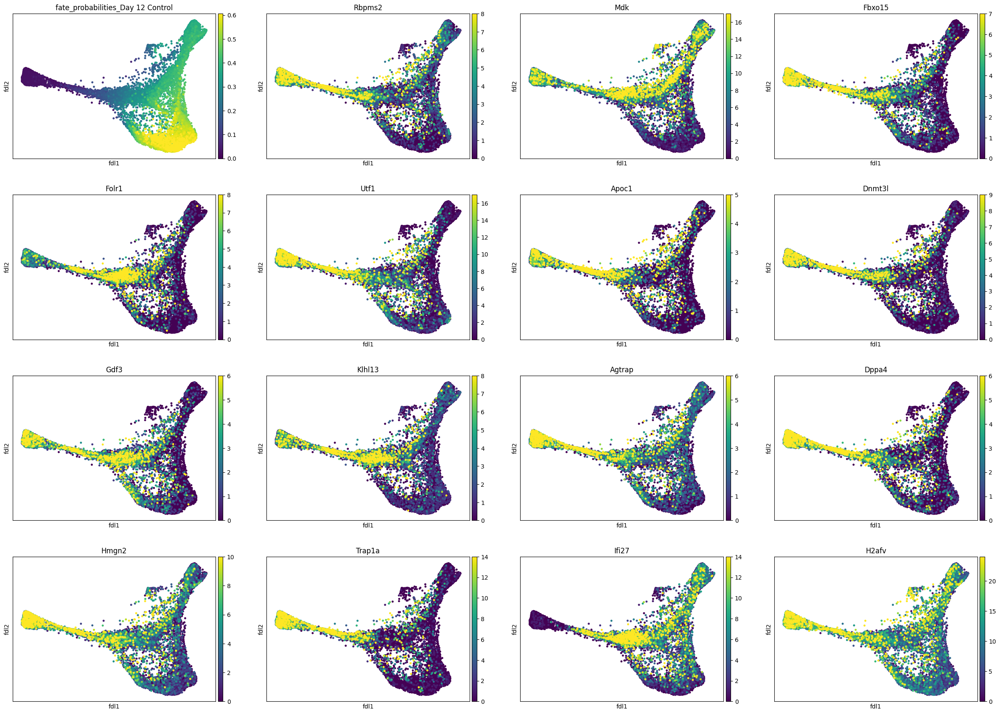

In [28]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

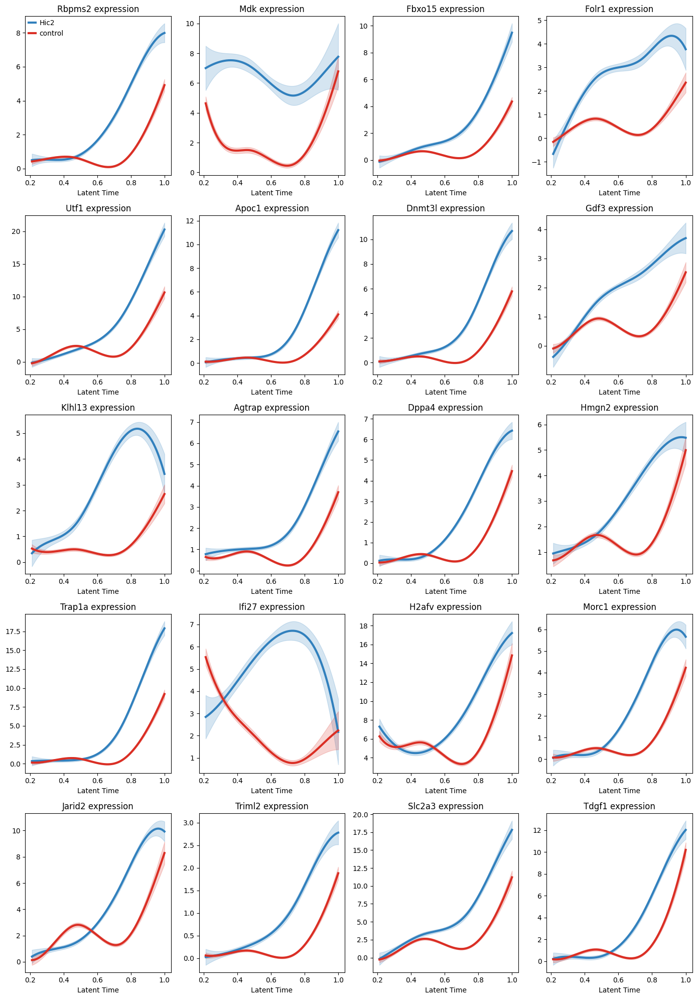

In [99]:
# Expression of drivers
stem_cell_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=True).head(20).index

single_cell_analysis.plot_grouped_gene_trend(
    adata, 
    stem_cell_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


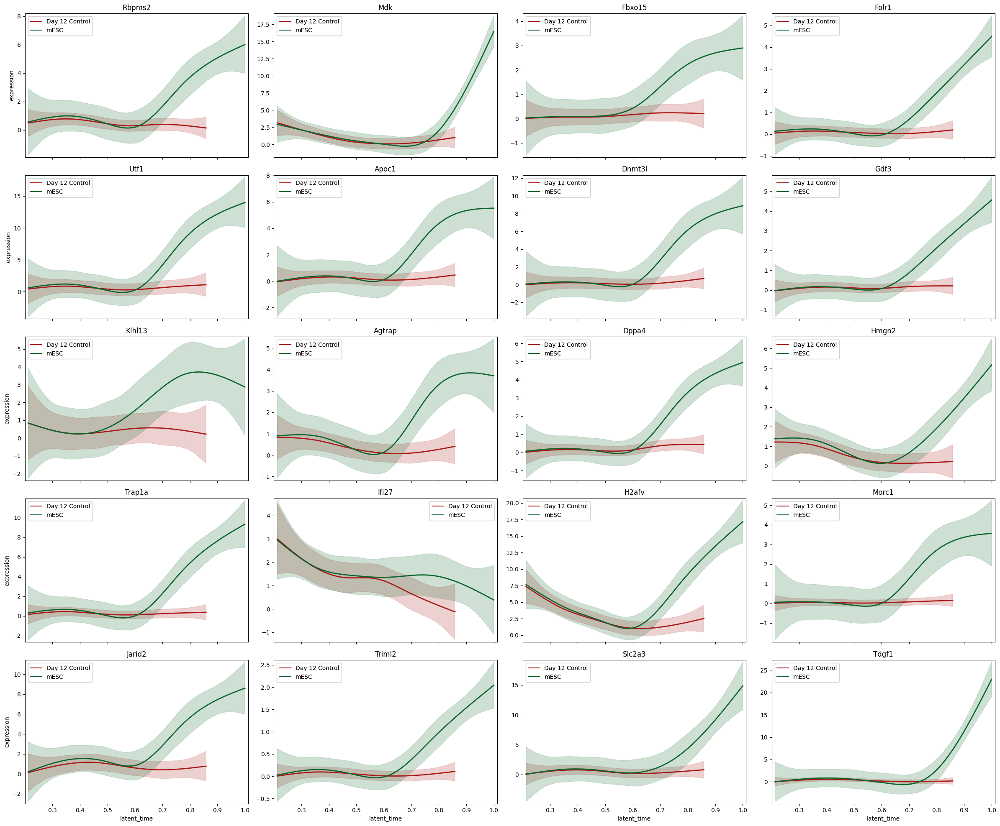

In [30]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

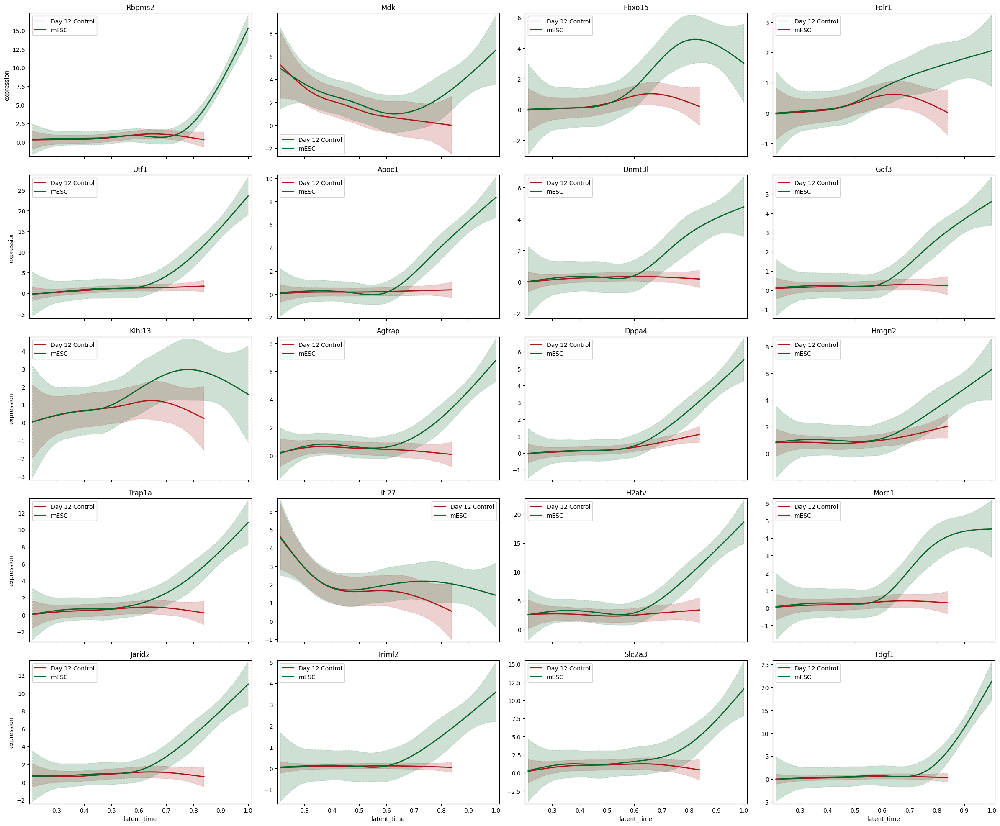

In [31]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

# Early drivers

In [32]:
latent_time_cutoff = 0.7

reprogramming_groups = ["Hic2", "control"]
control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"

# Create a variable for early cells
early_array = numpy.full(adata.shape[0], "Late", dtype=object)
early_array[adata.obs["group"].isin(reprogramming_groups) & (adata.obs["latent_time"] < latent_time_cutoff)] = "Early"
adata.obs["early_or_late"] = pandas.Series(early_array, index=adata.obs.index).astype("category")

In [33]:
# Find driver genes for all terminal states

early_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Early"
)

In [34]:
# Dead end drivers
combined_df = early_driver_df[[corr_column]].rename(columns={corr_column: "Early correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Early correlation", ascending=True).head(30)

,Early correlation,Full correlation
gene_names,,
Cd24a,-0.661327,-0.666161
Lmo1,-0.594814,-0.591417
Tmem238,-0.565221,-0.536205
Mal,-0.552312,-0.487651
Lgals7,-0.539821,-0.573641
Rtn4r,-0.534904,-0.570927
S100a16,-0.519256,-0.525246
Crip2,-0.507393,-0.579637
Tlx2,-0.496697,-0.479133


In [35]:
# Stem cell drivers
combined_df.sort_values("Early correlation", ascending=False).head(30)

,Early correlation,Full correlation
gene_names,,
Mdk,0.604832,0.588931
Folr1,0.604671,0.579031
Car2,0.557678,0.471406
Klhl13,0.539315,0.558729
Gdf3,0.530782,0.558953
Fgfbp1,0.526394,0.481486
Fbxo15,0.522104,0.588022
Ifi27,0.516173,0.525646
Utf1,0.493817,0.577003


In [36]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Early correlation")

,Early correlation,Full correlation
gene_names,,
Tlx2,-0.496697,-0.479133
Dmrtc2,-0.418664,-0.442655
Ovol1,-0.387979,-0.443452
Zbtb7c,-0.274898,-0.357488
Myc,-0.206220,-0.348143
Cdh1,-0.192256,-0.308703
Klf2,0.181509,0.369637
Rest,0.254052,0.388094
Zfp42,0.321575,0.467972


# Late drivers

In [37]:
# Find driver genes for all terminal states

late_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Late"
)

In [38]:
# Dead end drivers
combined_df = late_driver_df[[corr_column]].rename(columns={corr_column: "Late correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Late correlation", ascending=True).head(30)

,Late correlation,Full correlation
gene_names,,
B2m,-0.782764,-0.442145
Ctsz,-0.744971,-0.574908
Prr13,-0.740083,-0.516316
Pcolce,-0.727160,-0.390378
H2-D1,-0.725247,-0.255440
Krt8,-0.716009,-0.440561
Cd24a,-0.710608,-0.666161
Emp3,-0.697328,-0.362163
Gsto1,-0.697248,-0.475513


In [39]:
combined_df.sort_values("Late correlation", ascending=False).head(30)

,Late correlation,Full correlation
gene_names,,
Dppa5a,0.833114,0.492546
Tdgf1,0.791143,0.494839
Ifitm1,0.789843,0.395479
Trap1a,0.777983,0.543612
Klf2,0.758791,0.369637
Zfp42,0.757021,0.467972
Tet1,0.756022,0.484521
H2afv,0.754168,0.524962
Utf1,0.739445,0.577003


In [40]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Late correlation")

,Late correlation,Full correlation
gene_names,,
Myc,-0.560578,-0.348143
Tlx2,-0.554099,-0.479133
Dmrtc2,-0.525743,-0.442655
Zbtb7c,-0.524118,-0.357488
Ovol1,-0.506482,-0.443452
Cdh1,-0.146705,-0.308703
Tcf7l1,0.459919,0.431661
Rest,0.686255,0.388094
Jarid2,0.719038,0.503923


# Drivers in control group only

In [41]:
# Find driver genes for all terminal states

control_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="control"
)

In [42]:
# Dead end drivers
combined_df = control_driver_df[[corr_column]].rename(columns={corr_column: "Control correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Control correlation", ascending=True).head(30)

,Control correlation,Full correlation
gene_names,,
Uchl1,-0.566976,-0.522823
Ctsz,-0.512846,-0.574908
Crb3,-0.498825,-0.490890
Dsp,-0.486980,-0.490449
Shisa8,-0.479944,-0.451970
Dkkl1,-0.471419,-0.500613
Ifi30,-0.470296,-0.469271
Krt8,-0.460268,-0.440561
Perp,-0.456014,-0.460188


In [43]:
# Stem cell drivers
combined_df.sort_values("Control correlation", ascending=False).head(30)

,Control correlation,Full correlation
gene_names,,
Dppa5a,0.558899,0.492546
Rbpms2,0.543951,0.602228
Fn1,0.541413,0.426157
Sparc,0.536626,0.455673
Apoc1,0.527108,0.566876
Tdgf1,0.522735,0.494839
Trap1a,0.521554,0.543612
Agtrap,0.509073,0.557106
Utf1,0.508860,0.577003


In [44]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Control correlation")

,Control correlation,Full correlation
gene_names,,
Ovol1,-0.364260,-0.443452
Dmrtc2,-0.339486,-0.442655
Tlx2,-0.336176,-0.479133
Myc,-0.308806,-0.348143
Zbtb7c,-0.267514,-0.357488
Cdh1,-0.228277,-0.308703
Rest,0.333407,0.388094
Tcf7l1,0.400666,0.431661
Zfp42,0.402192,0.467972


# Drivers in Hic2 only

In [45]:
# Find driver genes for all terminal states

hic2_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="Hic2"
)

In [46]:
# Dead end drivers
combined_df = hic2_driver_df[[corr_column]].rename(columns={corr_column: "Hic2 correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Hic2 correlation", ascending=True).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Anxa5,-0.714810,-0.303736
Lmna,-0.701386,-0.384925
B2m,-0.699810,-0.442145
Ccnd2,-0.675295,-0.472549
S100a6,-0.664711,-0.119375
Abracl,-0.654750,-0.171320
Emp3,-0.654220,-0.362163
Vim,-0.649009,0.213615
Esd,-0.647543,-0.263091


In [47]:
# Stem cell drivers
combined_df.sort_values("Hic2 correlation", ascending=False).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Zfp42,0.690897,0.467972
Utf1,0.682165,0.577003
Apoc1,0.679625,0.566876
Fbxo15,0.676552,0.588022
Dppa4,0.673666,0.549051
Jarid2,0.662709,0.503923
Dnmt3l,0.661755,0.561188
Trap1a,0.659418,0.543612
Rbpms2,0.654720,0.602228


In [48]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Hic2 correlation")

,Hic2 correlation,Full correlation
gene_names,,
Myc,-0.253677,-0.348143
Tlx2,-0.164233,-0.479133
Zbtb7c,-0.141075,-0.357488
Ovol1,-0.098093,-0.443452
Dmrtc2,-0.055729,-0.442655
Cdh1,0.254475,-0.308703
Tcf7l1,0.345654,0.431661
Rest,0.427368,0.388094
Klf2,0.480031,0.369637


# Compare correlations in different groups

In [49]:
# Dead end drivers
combined_df = driver_df[[corr_column]].rename(columns={corr_column: "Full correlation"})
combined_df["Early correlation"] = early_driver_df[[corr_column]]
combined_df["Late correlation"] = late_driver_df[[corr_column]]
combined_df["Control correlation"] = control_driver_df[[corr_column]]
combined_df["Hic2 correlation"] = hic2_driver_df[[corr_column]]
combined_df.sort_values("Full correlation", ascending=True).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Cd24a,-0.666161,-0.661327,-0.710608,-0.449259,-0.422708
Lmo1,-0.591417,-0.594814,-0.655518,-0.402147,-0.232217
Crip2,-0.579637,-0.507393,-0.647302,-0.393837,-0.451330
Ctsz,-0.574908,-0.431604,-0.744971,-0.512846,-0.496622
Lgals7,-0.573641,-0.539821,-0.662717,-0.424758,-0.076808
Rtn4r,-0.570927,-0.534904,-0.638425,-0.435112,-0.163407
Tmem238,-0.536205,-0.565221,-0.467942,-0.326848,-0.526506
S100a16,-0.525246,-0.519256,-0.684973,-0.287602,-0.229931
Pcolce2,-0.525131,-0.470822,-0.555475,-0.380660,-0.326826


In [50]:
# Stem cell drivers
combined_df.sort_values("Full correlation", ascending=False).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Rbpms2,0.602228,0.481361,0.729209,0.543951,0.654720
Mdk,0.588931,0.604832,0.648704,0.469763,0.407259
Fbxo15,0.588022,0.522104,0.718641,0.482826,0.676552
Folr1,0.579031,0.604671,0.536012,0.433496,0.593723
Utf1,0.577003,0.493817,0.739445,0.508860,0.682165
Apoc1,0.566876,0.460315,0.603512,0.527108,0.679625
Dnmt3l,0.561188,0.467669,0.678680,0.491589,0.661755
Gdf3,0.558953,0.530782,0.664289,0.467477,0.594031
Klhl13,0.558729,0.539315,0.464772,0.382043,0.564215


# Expression trends for drivers identified with ChipSeq

In [62]:
# How ChipSeq target TFs correlate with fate probability in different groups

combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Full correlation")

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Tlx2,-0.479133,-0.496697,-0.554099,-0.336176,-0.164233
Ovol1,-0.443452,-0.387979,-0.506482,-0.364260,-0.098093
Dmrtc2,-0.442655,-0.418664,-0.525743,-0.339486,-0.055729
Zbtb7c,-0.357488,-0.274898,-0.524118,-0.267514,-0.141075
Myc,-0.348143,-0.206220,-0.560578,-0.308806,-0.253677
Cdh1,-0.308703,-0.192256,-0.146705,-0.228277,0.254475
Klf2,0.369637,0.181509,0.758791,0.424261,0.480031
Rest,0.388094,0.254052,0.686255,0.333407,0.427368
Tcf7l1,0.431661,0.357336,0.459919,0.400666,0.345654


## Dead end drivers

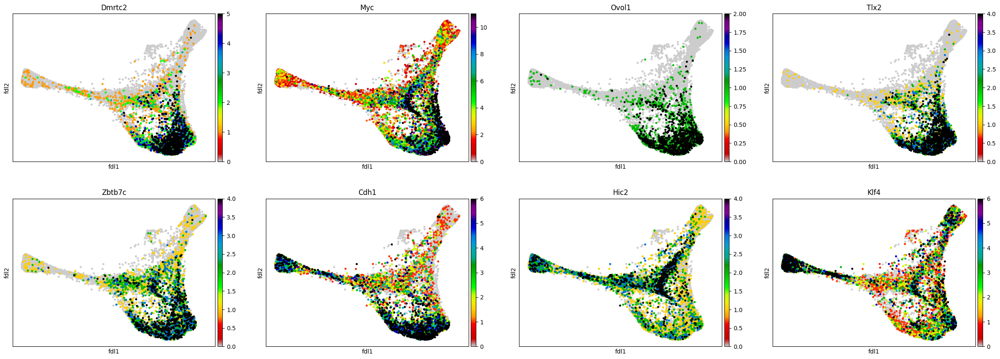

In [75]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=dead_end_tfs + ["Hic2", "Klf4"],
    color_map="nipy_spectral_r",
    s=50,
    ncols=4,
    vmax="p96",
)

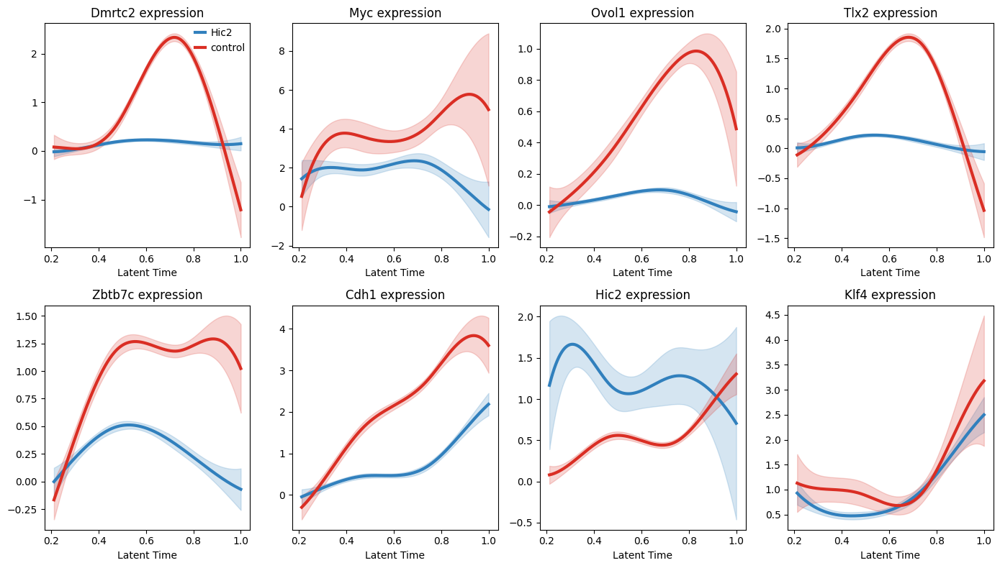

In [100]:
# Expression of dead end drivers

single_cell_analysis.plot_grouped_gene_trend(
    adata,
    dead_end_tfs+["Hic2", "Klf4"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=4
)

  0%|          | 0/8 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


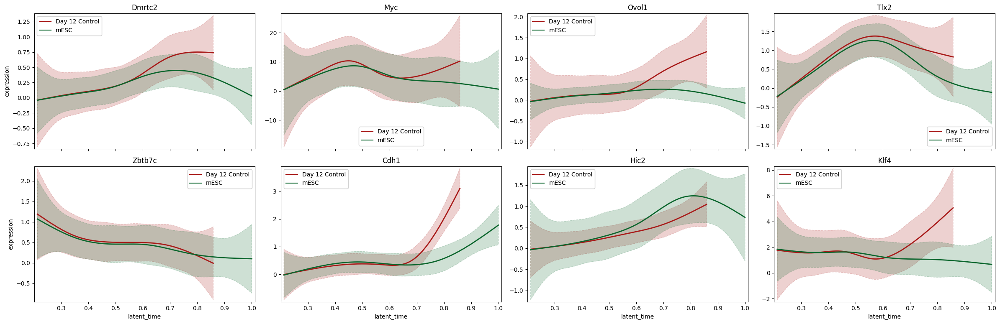

In [70]:
# Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_tfs+["Hic2", "Klf4"],
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


Ovol1 has the clearest correlation with the dead end, but Tlx2, Dmtrc2 and Myc are also interesting.

  0%|          | 0/8 [00:00<?, ?gene/s]

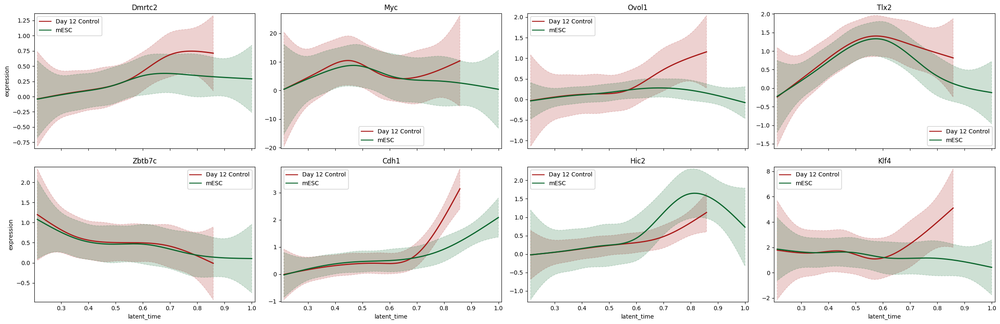

In [73]:
# Control only

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=dead_end_tfs+["Hic2", "Klf4"],
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/8 [00:00<?, ?gene/s]

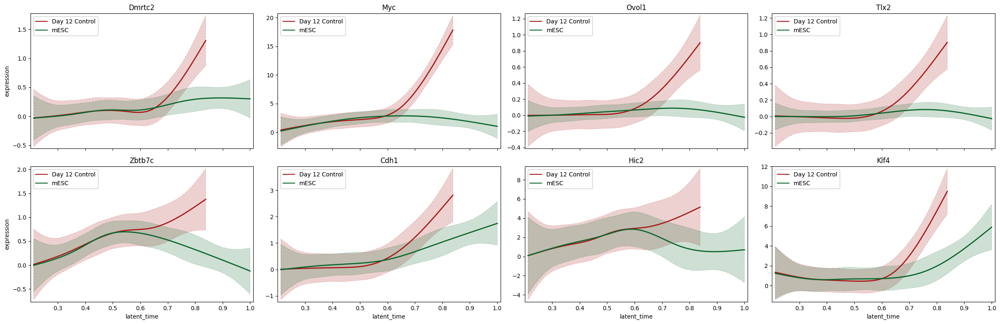

In [74]:
# Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_tfs + ["Hic2", "Klf4"],
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


With only Hic2 OX cells, it is clearer that cells ending up in the dead end have high Dmtrc2, Myc, Ovol1, Tlx2, Tshz1 and Zbtb7. Dmtrc2, Ovol1 and Tlx2 have patterns typical of targets in the group comparison. The three most interesting targets are Dmtrc2, Ovol1 and Tlx2.

## Stem cell drivers

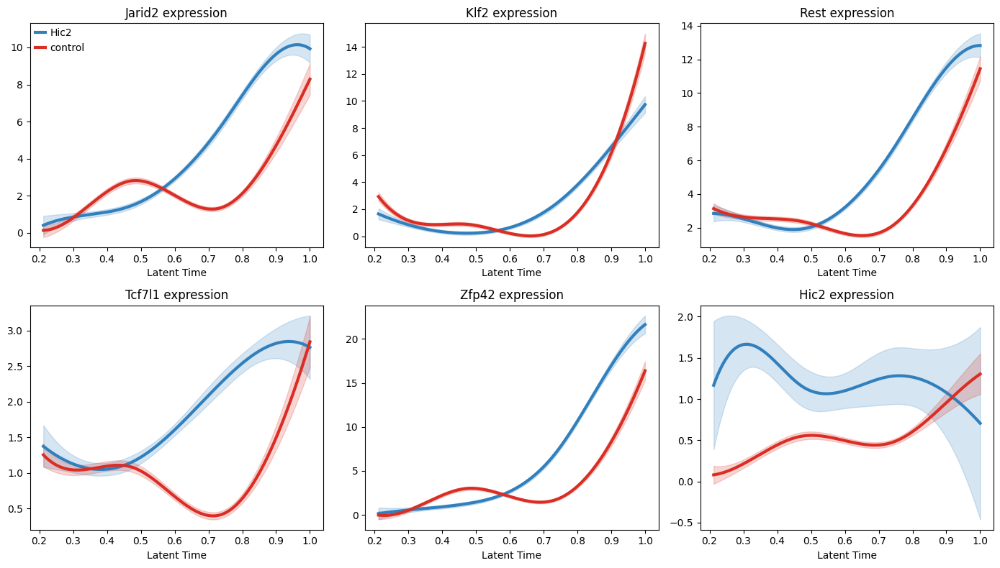

In [101]:
# Expression of reprogramming drivers

single_cell_analysis.plot_grouped_gene_trend(
    adata,
    stem_cell_tfs+["Hic2"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/5 [00:00<?, ?gene/s]

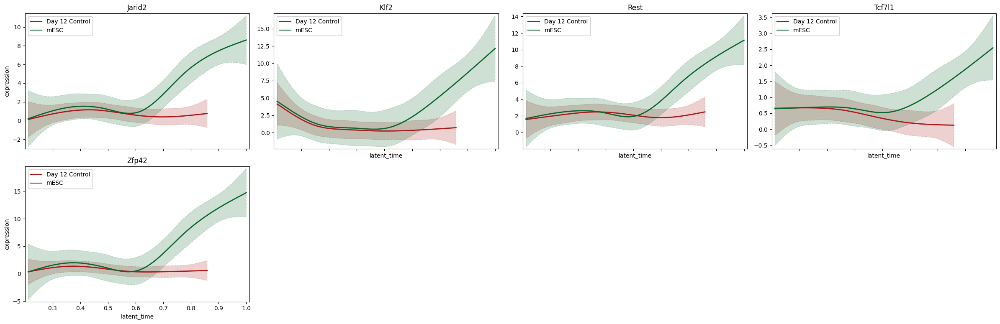

In [57]:
# Trends separated by trajectory, Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/5 [00:00<?, ?gene/s]

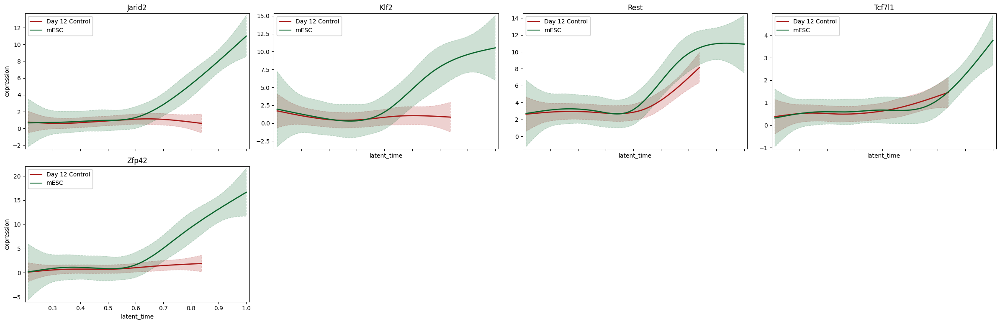

In [58]:
# Trends separated by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


# Trends for genes of interest

In [103]:
genes_of_interest = ["Klf4", "Myc", "Hic2", "Ovol1", "Cdh1", "Atf3", "Maff", "Crebrf", "Zbtb10", "Junb", "Arid3a", "Klf6", "Klf4", "Klf10", "Snai2"]

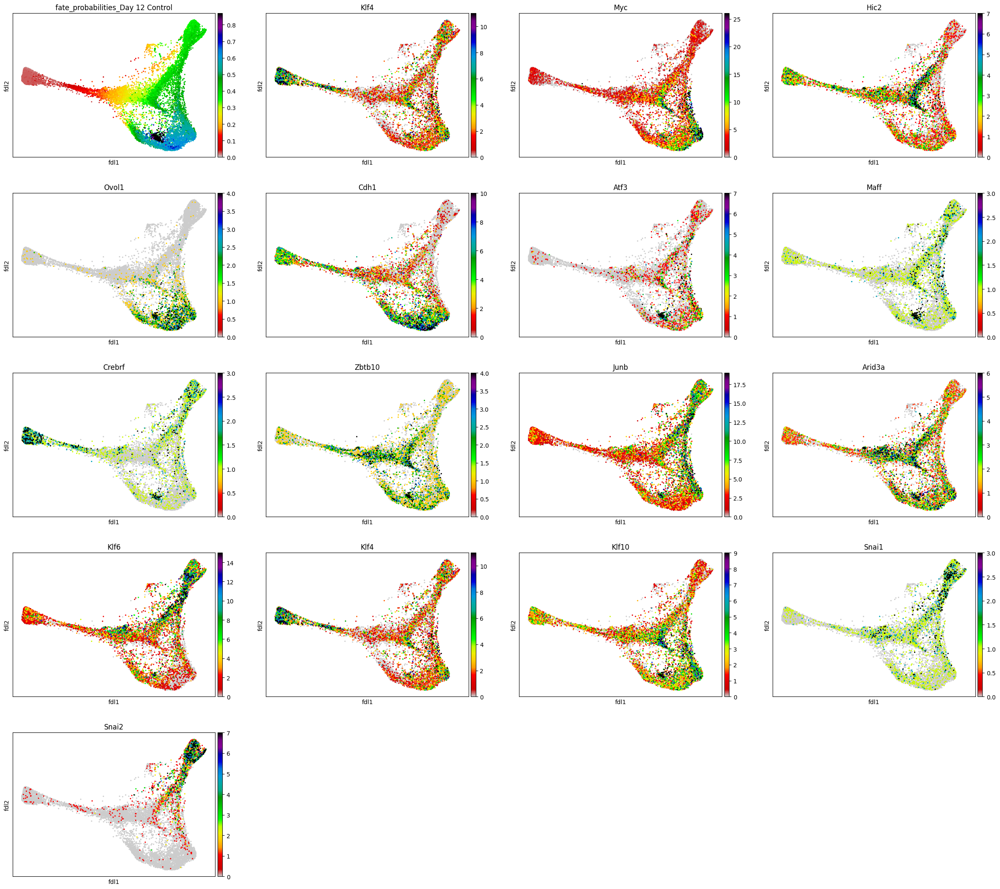

In [60]:
# Visualize genes of interest

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + genes_of_interest,
    color_map="nipy_spectral_r",
    s=20,
    ncols=4,
    vmax="p99",
)

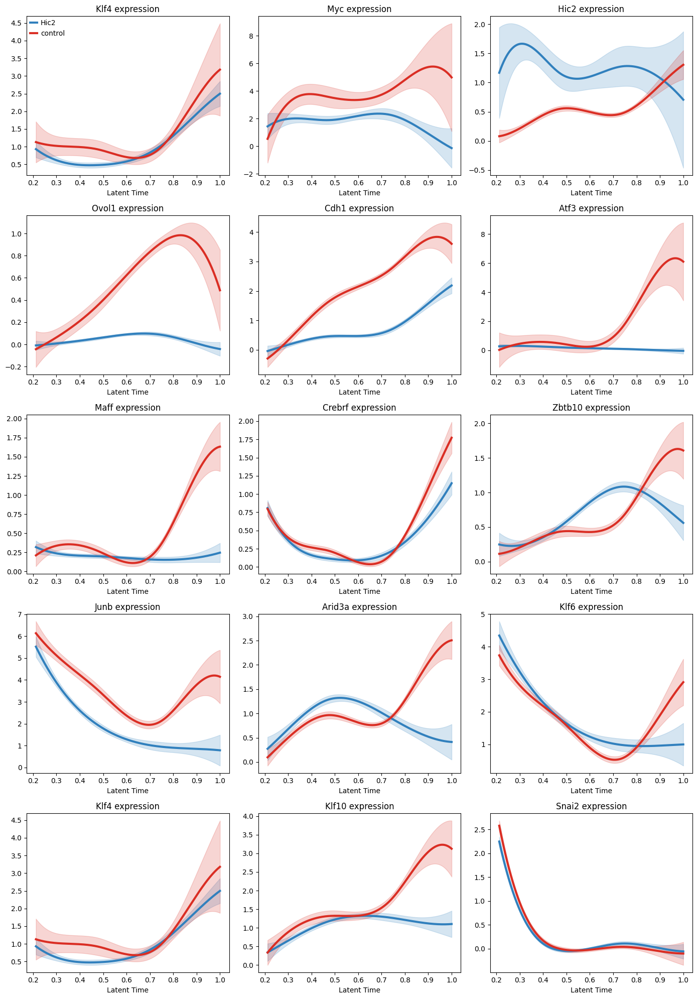

In [104]:
single_cell_analysis.plot_grouped_gene_trend(
    adata,
    genes_of_interest,
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/13 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


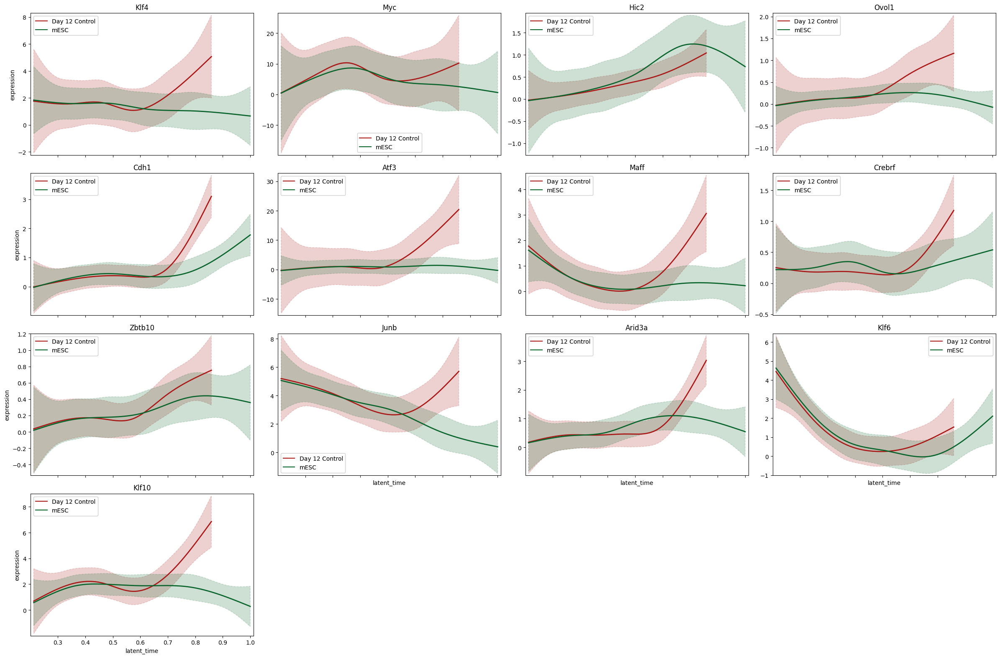

In [ ]:
# Trends separated by trajectory, Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/13 [00:00<?, ?gene/s]

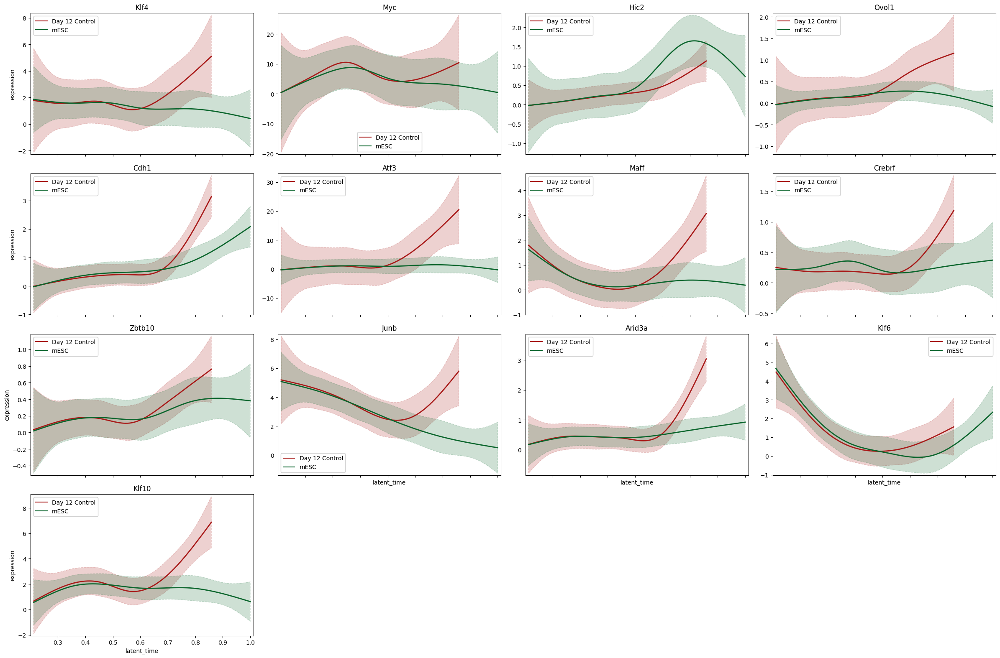

In [ ]:
# Trends separated by trajectory, control only

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/13 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


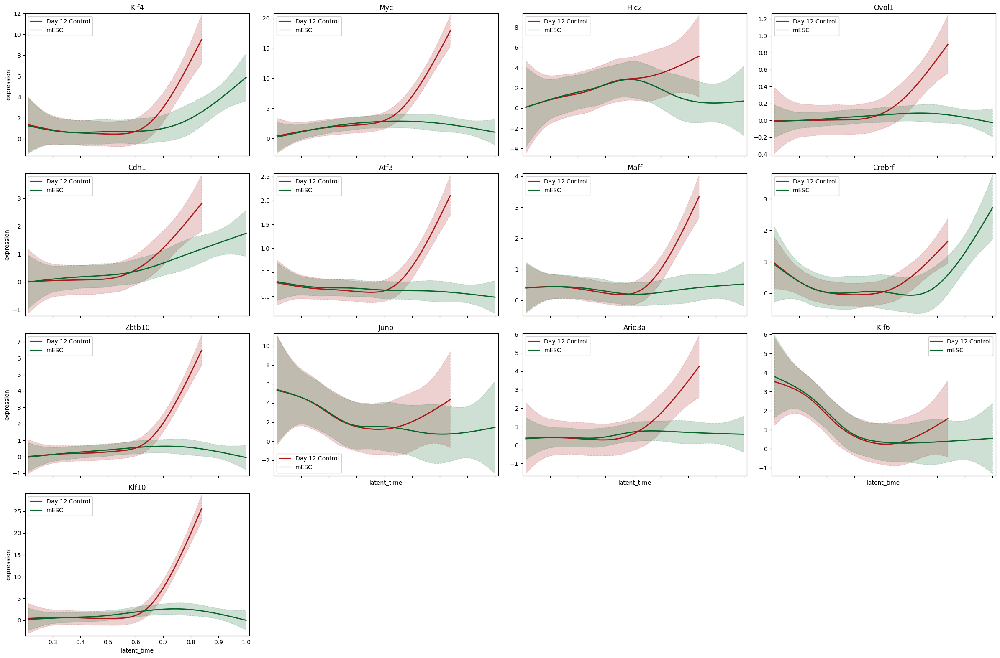

In [ ]:
# Trends separated by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


# Save results

In [ ]:
# Save results

base_name = "cellrank_version_5"

adata.write_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes.csv",
)

early_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_early.csv",
)

late_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_late.csv",
)

control_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_control.csv",
)

hic2_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_hic2.csv",
)

combined_df.to_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
)